In [15]:
import pandas as pd 
import numpy as np 
import plotly.express as px
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [16]:
files_2014 = ['uber-raw-data-apr14.csv', 'uber-raw-data-may14.csv', 'uber-raw-data-jun14.csv', 'uber-raw-data-jul14.csv', 'uber-raw-data-aug14.csv', 'uber-raw-data-sep14.csv']

data_2014 = pd.DataFrame()
for file in files_2014:
    data = pd.read_csv('uber-trip-data/' + file)
    data_2014 = pd.concat([data_2014, data])

In [17]:
# Basic stats
print("Number of rows : {}".format(data_2014.shape[0]))
print()

print("Display of dataset: ")
display(data_2014.head())
print()

print("Basics statistics: ")
data_desc = data_2014.describe(include='all')
display(data_desc)
print()

print("Percentage of missing values: ")
display(100*data_2014.isnull().sum()/data_2014.shape[0])

Number of rows : 4534327

Display of dataset: 


,Date/Time,Lat,Lon,Base
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512



Basics statistics: 


,Date/Time,Lat,Lon,Base
count,4534327,4.534327e+06,4.534327e+06,4534327
unique,260093,NaN,NaN,5
top,4/7/2014 20:21:00,NaN,NaN,B02617
freq,97,NaN,NaN,1458853
mean,NaN,4.073926e+01,-7.397302e+01,NaN
std,NaN,3.994991e-02,5.726670e-02,NaN
min,NaN,3.965690e+01,-7.492900e+01,NaN
25%,NaN,4.072110e+01,-7.399650e+01,NaN
50%,NaN,4.074220e+01,-7.398340e+01,NaN
75%,NaN,4.076100e+01,-7.396530e+01,NaN



Percentage of missing values: 


Date/Time    0.0
Lat          0.0
Lon          0.0
Base         0.0
dtype: float64

Le jeu de données est assez volumineux, prenez un échantillon de 10 000 observations

In [9]:
data_sample = data.sample(200000)
data_sample.head()

,Date/Time,Lat,Lon,Base
552344,9/22/2014 11:03:00,40.7728,-73.9624,B02617
84783,9/7/2014 8:12:00,40.7672,-73.8970,B02598
523473,9/19/2014 22:00:00,40.7239,-74.0023,B02617
780444,9/19/2014 19:50:00,40.7209,-74.0041,B02682
863127,9/4/2014 18:43:00,40.6913,-74.1773,B02764


In [10]:
data_sample.shape

(200000, 4)

À l'aide de plotly scatter mapbox, visualisation des points de données sur une carte. Vous devez également différencier les couleurs en fonction du titre

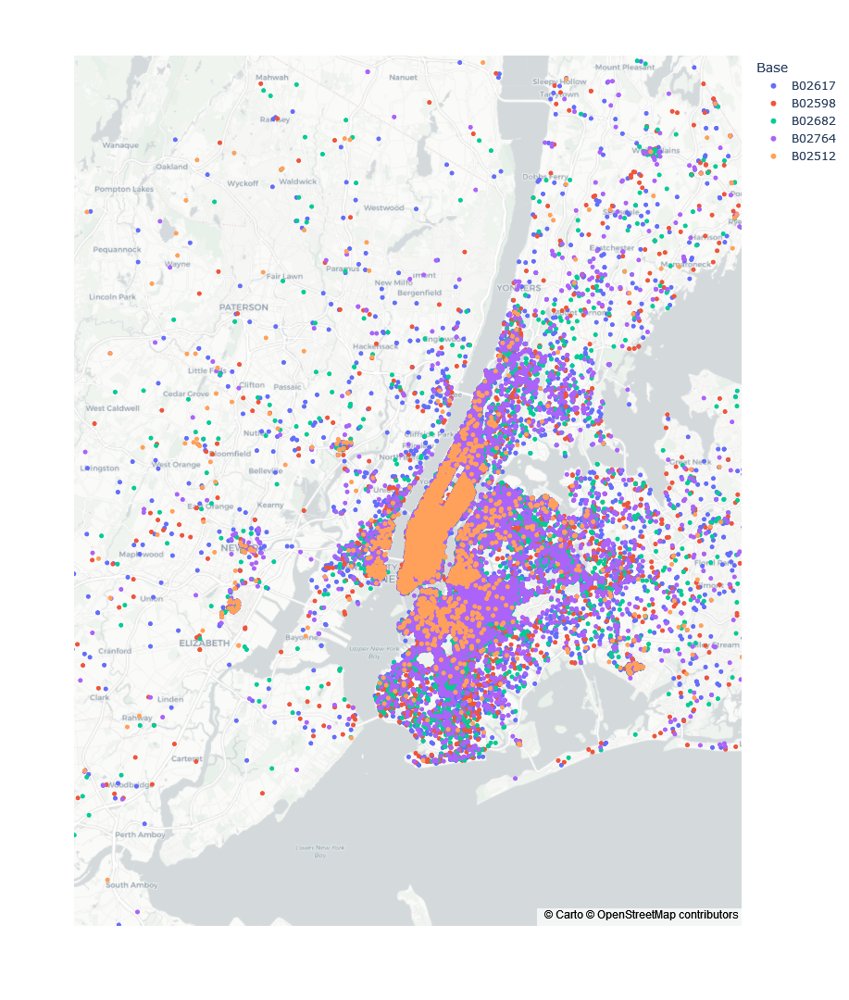

In [11]:
fig = px.scatter_mapbox(
        data_sample, 
        lat="Lat", 
        lon="Lon",
        color="Base",
        mapbox_style="carto-positron"
)

fig.show()

In [18]:
# convert all observations of Date to datetime
data_2014.loc[:,'Date/Time'] = pd.to_datetime(data_2014['Date/Time'])

# sort values by date
data_2014 =data_2014.sort_values(by = 'Date/Time')
data_2014.head()

,Date/Time,Lat,Lon,Base
35537,2014-04-01 00:00:00,40.7188,-73.9863,B02598
326800,2014-04-01 00:00:00,40.7215,-73.9952,B02682
35536,2014-04-01 00:00:00,40.7637,-73.9600,B02598
218799,2014-04-01 00:01:00,40.7355,-73.9966,B02617
326801,2014-04-01 00:02:00,40.7184,-73.9601,B02682


In [19]:
##data_2014['Date/Time'].dt.day_name()

###Create new columns in the dataset:Month Year day day of week

data_2014.loc[:, 'hour'] = data_2014['Date/Time'].dt.hour
data_2014.loc[:, 'Month'] = data_2014['Date/Time'].dt.month
data_2014.loc[:, 'Day'] = data_2014['Date/Time'].dt.day
data_2014.head()

,Date/Time,Lat,Lon,Base,hour,Month,Day
35537,2014-04-01 00:00:00,40.7188,-73.9863,B02598,0,4,1
326800,2014-04-01 00:00:00,40.7215,-73.9952,B02682,0,4,1
35536,2014-04-01 00:00:00,40.7637,-73.9600,B02598,0,4,1
218799,2014-04-01 00:01:00,40.7355,-73.9966,B02617,0,4,1
326801,2014-04-01 00:02:00,40.7184,-73.9601,B02682,0,4,1


In [8]:
X = data_2014
X.head()

,Date/Time,Lat,Lon,Base,425,-74.2596,B02598
0,4/1/2014 0:11:00,40.7690,-73.9549,B02512,NaN,NaN,NaN
1,4/1/2014 0:17:00,40.7267,-74.0345,B02512,NaN,NaN,NaN
2,4/1/2014 0:21:00,40.7316,-73.9873,B02512,NaN,NaN,NaN
3,4/1/2014 0:28:00,40.7588,-73.9776,B02512,NaN,NaN,NaN
4,4/1/2014 0:33:00,40.7594,-73.9722,B02512,NaN,NaN,NaN


In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 823561 entries, 9/21/2014 9:12:00 to 9/30/2014 22:58:00
Data columns (total 3 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   425       823561 non-null  float64
 1   -74.2596  823561 non-null  float64
 2   B02598    823561 non-null  object 
dtypes: float64(2), object(1)
memory usage: 25.1+ MB


Normalize dataset


In [13]:
from sklearn.preprocessing import StandardScaler

xnum = X.loc[:,'Date/Time', 'Lat', 'Lon', '425', '-74.2596', ]
xcat = X.loc[:,'Base','B02598']

sc= StandardScaler()
xnum = pd.DataFrame(sc.fit_transform(xnum), columns=xnum.columns)

X = pd.merge(xnum,xcat, left_index=True, right_index=True)
X = pd.get_dummies(X, drop_first=True)

IndexingError: Too many indexers

K-means


In [ ]:
from sklearn.cluster import KMeans

cluster = KMeans(n_clusters = 8, random_state = 0)

cluster.fit(X)

In [ ]:
X['cluster_id'] = cluster.labels_
X.head()

SELECT OPTIMAL NUMBER OF CLUSTERS K

Elbow

In [ ]:
wcss =[]
k = []

for i in range [1,11]:
    kmeans = Kmeans(n_clusters = i, random_state = 0)
    kmeans.fit(X)
    k.append(i)
    wcss.append(kmeans.inertia)
    
print(k)
print(wcss)


In [ ]:
# Let's visualize using plotly
import plotly.express as px

# Create DataFrame
wcss_frame = pd.Series(wcss)
k_frame = pd.Series(k)

# Create figure
fig= px.line(x=k_frame,y=wcss_frame)

# Create title and axis labels
fig.update_layout(
    yaxis_title="Inertia",
    xaxis_title="# Clusters",
    title="Inertia per cluster"
)

# Render
#fig.show(renderer="notebook")
fig.show(renderer="iframe") # if using workspac

Silhouette

In [ ]:
from sklearn.metrics import silhouette_score

# Computer mean silhouette score
sil = []
k = []

## Careful, you need to start at i=2 as silhouette score cannot accept less than 2 labels 
for i in range (2,11): 
    kmeans = KMeans(n_clusters= i, init = "k-means++", random_state = 0)
    kmeans.fit(X)
    sil.append(silhouette_score(X, kmeans.labels_)#predict(X)
    k.append(i)

print(k)
print(sil)
    

In [ ]:
# Create a data frame 
cluster_scores=pd.Series(sil)
k_frame = pd.Series(k)

# Create figure
fig = px.bar(x=k, y=cluster_scores)

# Add title and axis labels
fig.update_layout(
    yaxis_title="Silhouette Score",
    xaxis_title="# Clusters",
    title="Silhouette Score per cluster"
)

# Render
#fig.show(renderer="notebook")
fig.show(renderer="iframe") # if using work

DBSCANS

In [ ]:
# import DBSCAN from sklearn and numpy
from sklearn.cluster import DBSCAN
import numpy as np

# Instanciate DBSCAN 
db = DBSCAN(eps=0.2, min_samples=2000, metric="euclidean", algorithm="brute")

# Fit on data 
## No need to normalize data, it already is! 
db.fit(X)

# Visualize with plotly 

## Import go to build our own figure
import plotly.graph_objects as go

fig = go.Figure()

# Loop through each label for our cluster
for i in np.unique(db.labels_):
    label = X[db.labels_ == i]
    fig.add_trace(go.Scatter(x=label[:, 0], y=label[:, 1], mode="markers", name="Cluster {}".format(i)))

fig.show('notebook')


Find out how many clusters DBSCAN created. 

In [ ]:
np.unique(db.labels_)

Ajoutez une nouvelle colonne "cluster" à X où chaque observation sera l'étiquette du cluster correspondant.


In [ ]:
X["cluster"] = db.labels_
X.head()

Visualisez tous les clusters sur une carte à l'exception de tous ceux que DBSCAN a considérés comme des valeurs aberrantes

In [ ]:
fig = px.scatter_mapbox(
        X[X.cluster != -1], 
        lat="lat", 
        lon="lng",
        color="cluster",
        mapbox_style="carto-positron"
)

fig.show()